#AIT 614 DL1
#Final Project 
#Team 2

Import file

In [0]:
df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/sshahulh@gmu.edu/adult_100-3.csv", inferSchema = 'true')

Import libraries

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, sum

In [0]:
df.printSchema()

root
 |-- age: integer (nullable = true)
 |-- workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- education: string (nullable = true)
 |-- education_num: integer (nullable = true)
 |-- marital_status: string (nullable = true)
 |-- occupation: string (nullable = true)
 |-- relationship: string (nullable = true)
 |-- race: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- capital_gain: integer (nullable = true)
 |-- capital_loss: integer (nullable = true)
 |-- hours_per_week: integer (nullable = true)
 |-- native_country: string (nullable = true)
 |-- income: string (nullable = true)



Data Preprocessing

In [0]:
#df=df.replace('?',None).fillna("")

In [0]:
from pyspark.sql.functions import col,isnan, when, count
df_columns= ['workclass','occupation','native_country']
#df.select([count(when((col(c) == '?'))).alias(c) for c in df_columns]).show()




# Find count for empty, None, Null, Nan with string literals.
#from pyspark.sql.functions import col,isnan,when,count
#df2 = df.select([count(when((col(c) == '?' ))).alias(c) for c in df.columns])
#df2.show()


from pyspark.sql.functions import col, count, when

# Create a list comprehension to count the number of '?' in each column
df2 = df.select([count(when(col(c) == '?', c)).alias(c) for c in df_columns])

# Show the resulting DataFrame
df2.show()



+---------+----------+--------------+
|workclass|occupation|native_country|
+---------+----------+--------------+
|     1836|      1843|           583|
+---------+----------+--------------+



Total no:of records

In [0]:
df.count()

Out[159]: 32561

In [0]:
from pyspark.sql.functions import col, mode

# Calculate the mode of the age column
workclass_mode = df.select(mode("workclass")).collect()[0][0]

# Replace all occurrences of ? in the age column with the mode
df = df.withColumn("workclass", when(col("workclass") == "?", workclass_mode).otherwise(col("workclass")))


In [0]:
from pyspark.sql.functions import col, mode

# Calculate the mode of the age column
occ_mode = df.select(mode("occupation")).collect()[0][0]

# Replace all occurrences of ? in the age column with the mode
df = df.withColumn("occupation", when(col("occupation") == "?", occ_mode).otherwise(col("occupation")))


In [0]:
from pyspark.sql.functions import col, mode

# Calculate the mode of the age column
nc_mode = df.select(mode("native_country")).collect()[0][0]

# Replace all occurrences of ? in the age column with the mode
df = df.withColumn("native_country", when(col("native_country") == "?", nc_mode).otherwise(col("native_country")))

Verfying whether null values exists

In [0]:
# Checking whether null values are present or not
df2 = df.select([count(when(col(c) == '?', c)).alias(c) for c in df_columns])

# Show the resulting DataFrame
df2.show()

+---------+----------+--------------+
|workclass|occupation|native_country|
+---------+----------+--------------+
|        0|         0|             0|
+---------+----------+--------------+



In [0]:
display(df)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
90,Private,77053,HS-grad,9,Widowed,Prof-specialty,Not-in-family,White,Female,0,4356,40,United-States,<=50K
82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
66,Private,186061,Some-college,10,Widowed,Prof-specialty,Unmarried,Black,Female,0,4356,40,United-States,<=50K
54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K
34,Private,216864,HS-grad,9,Divorced,Other-service,Unmarried,White,Female,0,3770,45,United-States,<=50K
38,Private,150601,10th,6,Separated,Adm-clerical,Unmarried,White,Male,0,3770,40,United-States,<=50K
74,State-gov,88638,Doctorate,16,Never-married,Prof-specialty,Other-relative,White,Female,0,3683,20,United-States,>50K
68,Federal-gov,422013,HS-grad,9,Divorced,Prof-specialty,Not-in-family,White,Female,0,3683,40,United-States,<=50K
41,Private,70037,Some-college,10,Never-married,Craft-repair,Unmarried,White,Male,0,3004,60,United-States,>50K


Data visualization

Graph-1: Bar Graph Analysis of Education Levels among Surveyed Population

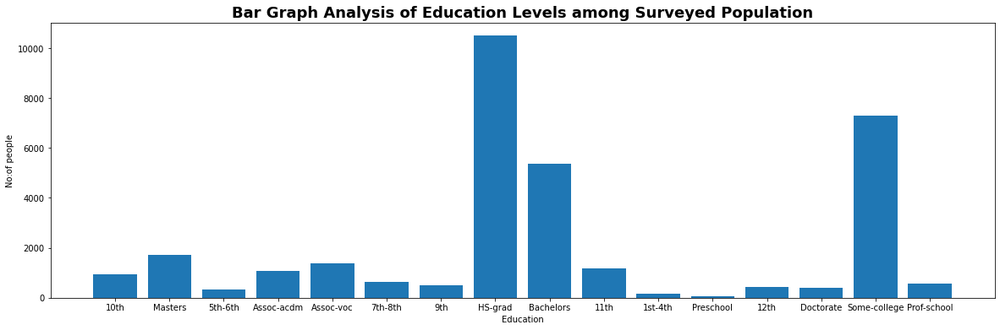

In [0]:
from pyspark.sql.functions import avg
import matplotlib.pyplot as plt

# Group the data by education and counting the total records in each level
edu_df = df.groupBy("education").agg(count("education").alias("count"))

# Converting the PySpark dataframe to  pandas dataframe
edu_pandas = edu_df.toPandas()


plt.figure(figsize=(20,6))


# Plot a bar chart of education level count
plt.bar(edu_pandas["education"], edu_pandas["count"])
plt.title("Bar Graph Analysis of Education Levels among Surveyed Population",fontsize=18, fontweight='bold')
plt.xlabel("Education")
plt.ylabel("No:of people")
plt.show()


In [0]:
import seaborn as sb

Graph-2: Income of Individuals of Different Genders

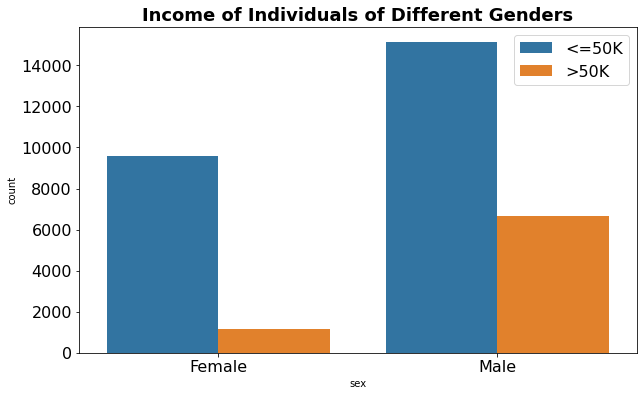

In [0]:
fig, ax = plt.subplots(figsize=(10, 6))
sb.countplot(data=df.toPandas(), x='sex', hue='income', ax=ax)
ax.set_title('Income of Individuals of Different Genders', fontsize=18, fontweight='bold')
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.legend(fontsize=16)

# show the plot
plt.show()

Graph-3: Income of Individuals of Different Occupations

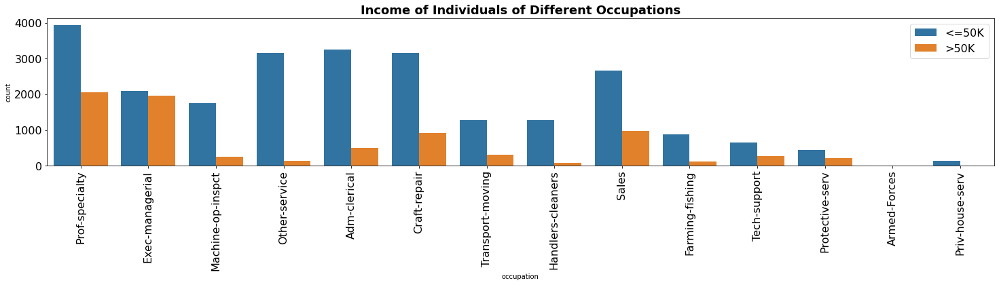

In [0]:
fig, ax = plt.subplots(figsize=(25, 4))
sb.countplot(data=df.toPandas(), x='occupation', hue='income', ax=ax)
ax.set_title('Income of Individuals of Different Occupations', fontsize=18, fontweight='bold')
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.legend(fontsize=16)

# rotate the x-axis labels to display them vertically
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# show the plot
plt.show()

Graph-4 : Comparison of Income among Different Education Levels

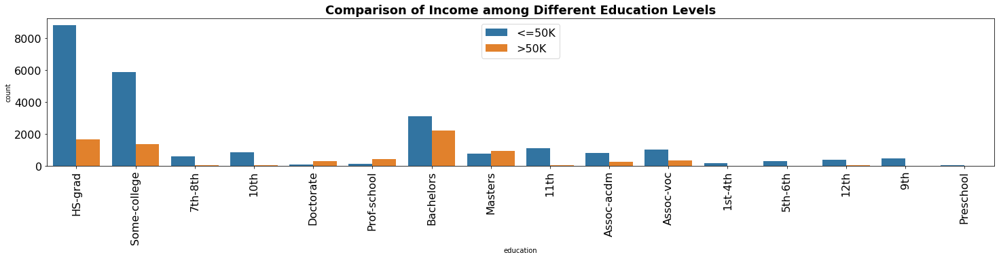

In [0]:
fig, ax = plt.subplots(figsize=(25, 4))

sb.countplot(data=df.toPandas(), x='education', hue='income', ax=ax)
ax.set_title('Comparison of Income among Different Education Levels', fontsize=18, fontweight='bold')
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.legend(fontsize=16)

# rotate the x-axis labels to display them vertically
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# show the plot
plt.show()

Graph-5 :Analysis of Income Disparities Based on Educational Attainment

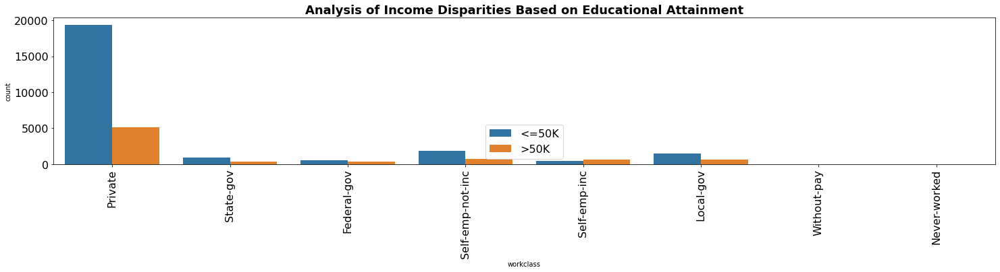

In [0]:
fig, ax = plt.subplots(figsize=(25, 4))

sb.countplot(data=df.toPandas(), x='workclass', hue='income', ax=ax)
ax.set_title('Analysis of Income Disparities Based on Educational Attainment', fontsize=18, fontweight='bold')
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.legend(fontsize=16)

# rotate the x-axis labels to display them vertically
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# show the plot
plt.show()

#AIT 614 DL1
#Final Project Machine Learning
#Team 2

In [0]:
df1 = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/sshahulh@gmu.edu/adult_100-3.csv", inferSchema = 'true')

In [0]:
# summarize the dataset
dbutils.data.summarize(df1)

<!DOCTYPE html>

In [0]:
df1.printSchema()

root
 |-- age: integer (nullable = true)
 |-- workclass: string (nullable = true)
 |-- fnlwgt: integer (nullable = true)
 |-- education: string (nullable = true)
 |-- education_num: integer (nullable = true)
 |-- marital_status: string (nullable = true)
 |-- occupation: string (nullable = true)
 |-- relationship: string (nullable = true)
 |-- race: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- capital_gain: integer (nullable = true)
 |-- capital_loss: integer (nullable = true)
 |-- hours_per_week: integer (nullable = true)
 |-- native_country: string (nullable = true)
 |-- income: string (nullable = true)



In [0]:
from pyspark.sql.functions import regexp_replace

df1 = df1.withColumn("workclass", regexp_replace("workclass", "\?", "NaN"))

In [0]:
distinct_count = df1.select("workclass").distinct()
display(distinct_count)

workclass
Self-emp-not-inc
Local-gov
State-gov
Private
Without-pay
Federal-gov
Never-worked
NaN
Self-emp-inc


In [0]:
trainDF, testDF = df1.randomSplit([0.7, 0.3], seed=100)
print(trainDF.cache().count()) # Cache because accessing training data multiple times
print(testDF.count())

22832
9729


In [0]:
display(trainDF)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
17,Federal-gov,99893,11th,7,Never-married,Adm-clerical,Not-in-family,Black,Female,0,1602,40,United-States,<=50K
17,Local-gov,32124,9th,5,Never-married,Other-service,Own-child,Black,Male,0,0,9,United-States,<=50K
17,Local-gov,39815,10th,6,Never-married,Other-service,Own-child,White,Female,0,0,25,United-States,<=50K
17,Local-gov,170916,10th,6,Never-married,Protective-serv,Own-child,White,Female,0,1602,40,United-States,<=50K
17,Local-gov,173497,11th,7,Never-married,Prof-specialty,Own-child,Black,Male,0,0,15,United-States,<=50K
17,Local-gov,175587,11th,7,Never-married,Protective-serv,Own-child,White,Male,0,0,30,United-States,<=50K
17,Local-gov,182070,11th,7,Never-married,Other-service,Own-child,White,Female,0,0,16,United-States,<=50K
17,Local-gov,191910,11th,7,Never-married,Sales,Own-child,White,Male,0,0,20,United-States,<=50K
17,Local-gov,192387,9th,5,Never-married,Other-service,Own-child,White,Male,0,0,45,United-States,<=50K
17,Local-gov,246308,11th,7,Never-married,Prof-specialty,Own-child,White,Female,0,0,20,Puerto-Rico,<=50K


In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
 
categoricalCols = ["workclass", "education", "marital_status", "occupation", "relationship", "race", "sex"]
 
# The following two lines are estimators. They return functions that we will later apply to transform the dataset.
stringIndexer = StringIndexer(inputCols=categoricalCols, outputCols=[x + "Index" for x in categoricalCols]) 
encoder = OneHotEncoder(inputCols=stringIndexer.getOutputCols(), outputCols=[x + "OHE" for x in categoricalCols]) 
 

In [0]:
stringIndexerModel = stringIndexer.fit(trainDF)

In [0]:
labelToIndex = StringIndexer(inputCol="income", outputCol="label")

In [0]:
from pyspark.ml.feature import VectorAssembler
 
# This includes both the numeric columns and the one-hot encoded binary vector columns in our dataset.
numericCols = ["age", "fnlwgt", "education_num", "capital_gain", "capital_loss", "hours_per_week"]
assemblerInputs = [c + "OHE" for c in categoricalCols] + numericCols
vecAssembler = VectorAssembler(inputCols=assemblerInputs, outputCol="features")

In [0]:
#Define the model
from pyspark.ml.classification import LogisticRegression
 
lr = LogisticRegression(featuresCol="features", labelCol="label", regParam=1.0)

In [0]:
#Build the model
from pyspark.ml import Pipeline
 
# Define the pipeline based on the stages created in previous steps.
pipeline = Pipeline(stages=[stringIndexer, encoder, labelToIndex, vecAssembler, lr])
 
# Define the pipeline model.
pipelineModel = pipeline.fit(trainDF)
 
# Apply the pipeline model to the test dataset.
predDF = pipelineModel.transform(testDF)

In [0]:
display(predDF.select("features", "label", "prediction", "probability"))

features,label,prediction,probability
"Map(vectorType -> sparse, length -> 59, indices -> List(2, 13, 24, 32, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 148194.0, 7.0, 12.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.895623160160636, 0.10437683983936397))"
"Map(vectorType -> sparse, length -> 59, indices -> List(2, 13, 24, 31, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 195262.0, 7.0, 35.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8695401514347058, 0.13045984856529425))"
"Map(vectorType -> sparse, length -> 59, indices -> List(2, 13, 24, 29, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 244856.0, 7.0, 40.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8599618999079389, 0.14003810009206108))"
"Map(vectorType -> sparse, length -> 59, indices -> List(2, 19, 24, 32, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 340043.0, 8.0, 12.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8907905889392121, 0.10920941106078785))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 34019.0, 6.0, 20.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8962762502487523, 0.10372374975124765))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 48703.0, 7.0, 30.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8996283800100727, 0.10037161998992727))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 13, 24, 36, 45, 49, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 48751.0, 7.0, 40.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9050348064448844, 0.09496519355511557))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 89870.0, 6.0, 40.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8869705544357251, 0.11302944556427486))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 9, 24, 36, 45, 50, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 110998.0, 10.0, 40.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.8816567378917145, 0.1183432621082855))"
"Map(vectorType -> sparse, length -> 59, indices -> List(3, 15, 24, 36, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 139183.0, 6.0, 15.0))",0.0,0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9076173288701047, 0.09238267112989529))"


In [0]:
#Evaluate the model
display(pipelineModel.stages[-1], predDF.drop("prediction", "rawPrediction", "probability"), "ROC")

False Positive Rate,True Positive Rate,Threshold
0.0,0.0,0.4993767080084476
0.0,0.03571428571428571,0.4993767080084476
0.0,0.07142857142857142,0.4644293902524771
0.0,0.10714285714285714,0.46147421761318697
0.0,0.14285714285714285,0.4533756097698187
0.0,0.17857142857142858,0.40967203140167907
0.011363636363636364,0.17857142857142858,0.40314248380516493
0.011363636363636364,0.21428571428571427,0.38104181779914637
0.011363636363636364,0.25,0.380316877412773
0.011363636363636364,0.2857142857142857,0.36703333874910427


In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
 
bcEvaluator = BinaryClassificationEvaluator(metricName="areaUnderROC")
print(f"Area under ROC curve: {bcEvaluator.evaluate(predDF)}")
 
mcEvaluator = MulticlassClassificationEvaluator(metricName="accuracy")
print(f"Accuracy: {mcEvaluator.evaluate(predDF)}")

mcEvaluator = MulticlassClassificationEvaluator(metricName="weightedRecall")
print(f"Recall: {mcEvaluator.evaluate(predDF)}")
mcEvaluator = MulticlassClassificationEvaluator(metricName="f1")
print(f"F1 score: {mcEvaluator.evaluate(predDF)}")
mcEvaluator = MulticlassClassificationEvaluator(metricName="weightedPrecision")
print(f"Precision: {mcEvaluator.evaluate(predDF)}")

from pyspark.mllib.evaluation import MulticlassMetrics

predictionAndLabels = predDF.select("prediction", "label").rdd
metrics = MulticlassMetrics(predictionAndLabels)

confusionMatrix = metrics.confusionMatrix()
print("Confusion Matrix:")
print(confusionMatrix)

Area under ROC curve: 0.889730139115927
Accuracy: 0.7699660807893925
Recall: 0.7699660807893925
F1 score: 0.6811434443288105
Precision: 0.8175380683143718
/databricks/spark/python/pyspark/sql/context.py:165: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(
Confusion Matrix:
DenseMatrix([[7.375e+03, 3.000e+00],
             [2.235e+03, 1.160e+02]])


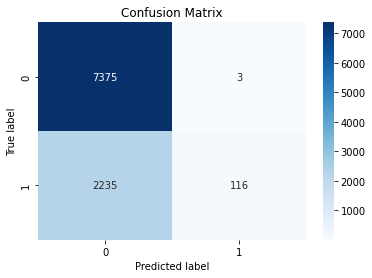

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the confusion matrix as a NumPy array
confusionMatrix = metrics.confusionMatrix().toArray()

# Plot the confusion matrix as a heatmap
sns.heatmap(confusionMatrix, annot=True, fmt="g", cmap="Blues")

# Add labels and title
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")

# Display the plot
plt.show()


In [0]:
#Hyperparameter tunning
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
 
paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.01, 0.5, 2.0])
             .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0])
             .build())

In [0]:
from pyspark.ml.classification import DecisionTreeClassifier
 
# Create initial Decision Tree Model
dt = DecisionTreeClassifier(labelCol="label", featuresCol="features", maxDepth=3)

In [0]:
# Create a 3-fold CrossValidator
cv = CrossValidator(estimator=pipeline, estimatorParamMaps=paramGrid, evaluator=bcEvaluator, numFolds=3)
 
# Run cross validations. This step takes a few minutes and returns the best model found from the cross validation.
cvModel = cv.fit(trainDF)


In [0]:
# Use the model identified by the cross-validation to make predictions on the test dataset
cvPredDF = cvModel.transform(testDF)
 
# Evaluate the model's performance based on area under the ROC curve and accuracy 
print(f"Area under ROC curve: {bcEvaluator.evaluate(cvPredDF)}")
print(f"Accuracy: {mcEvaluator.evaluate(cvPredDF)}")
mcEvaluator = MulticlassClassificationEvaluator(metricName="weightedRecall")
print(f"Recall: {mcEvaluator.evaluate(cvPredDF)}")
mcEvaluator = MulticlassClassificationEvaluator(metricName="f1")
print(f"F1 score: {mcEvaluator.evaluate(cvPredDF)}")
mcEvaluator = MulticlassClassificationEvaluator(metricName="weightedPrecision")
print(f"Precision: {mcEvaluator.evaluate(cvPredDF)}")

from pyspark.mllib.evaluation import MulticlassMetrics

predictionAndLabels1 = cvPredDF.select("prediction", "label").rdd
metrics1 = MulticlassMetrics(predictionAndLabels1)

confusionMatrix1 = metrics1.confusionMatrix()
print("Confusion Matrix:")
print(confusionMatrix1)

Area under ROC curve: 0.9067883942040269
Accuracy: 0.8411028398511939
Recall: 0.8483914071333127
F1 score: 0.8411214725788778
Precision: 0.8411028398511939
Confusion Matrix:
DenseMatrix([[6914.,  464.],
             [1011., 1340.]])


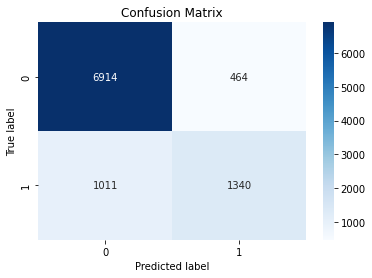

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the confusion matrix as a NumPy array
confusionMatrix1 = metrics1.confusionMatrix().toArray()

# Plot the confusion matrix as a heatmap
sns.heatmap(confusionMatrix1, annot=True, fmt="g", cmap="Blues")

# Add labels and title
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix")

# Display the plot
plt.show()


In [0]:
#For display prediction temperorary view of prediction is required
cvPredDF.createOrReplaceTempView("finalPredictions")
display(cvPredDF)

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,workclassIndex,educationIndex,marital_statusIndex,occupationIndex,relationshipIndex,raceIndex,sexIndex,workclassOHE,educationOHE,marital_statusOHE,occupationOHE,relationshipOHE,raceOHE,sexOHE,label,features,rawPrediction,probability,prediction
17,Local-gov,148194,11th,7,Never-married,Adm-clerical,Own-child,White,Female,0,0,12,United-States,<=50K,2.0,5.0,1.0,3.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(2, 13, 24, 32, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 148194.0, 7.0, 12.0))","Map(vectorType -> dense, length -> 2, values -> List(6.53927760659357, -6.53927760659357))","Map(vectorType -> dense, length -> 2, values -> List(0.9985565541826628, 0.001443445817337241))",0.0
17,Local-gov,195262,11th,7,Never-married,Craft-repair,Own-child,White,Male,0,0,35,United-States,<=50K,2.0,5.0,1.0,2.0,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 8, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(2, 13, 24, 31, 45, 48, 52, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 195262.0, 7.0, 35.0))","Map(vectorType -> dense, length -> 2, values -> List(5.289947785022374, -5.289947785022374))","Map(vectorType -> dense, length -> 2, values -> List(0.9949832709439407, 0.005016729056059321))",0.0
17,Local-gov,244856,11th,7,Never-married,Prof-specialty,Own-child,White,Female,0,0,40,United-States,<=50K,2.0,5.0,1.0,0.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())",0.0,"Map(vectorType -> sparse, length -> 59, indices -> List(2, 13, 24, 29, 45, 48, 53, 54, 55, 58), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 17.0, 244856.0, 7.0, 40.0))","Map(vectorType -> dense, length -> 2, values -> List(5.2647521482260595, -5.2647521482260595))","Map(vectorType -> dense, length -> 2, values -> List(0.9948559239123491, 0.005144076087650884))",0.0
17,Local-gov,340043,12th,8,Never-married,Adm-clerical,Own-child,White,Female,0,0,12,United-States,<=50K,2.0,11.0,1.0,3.0,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 8, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 15, indices -> List(11), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(1), 

In [0]:
%sql
SELECT income, Age,prediction, count(*) AS count
from finalPredictions
group by Age, income, prediction

income,Age,prediction,count
<=50K,72,0.0,14
<=50K,24,0.0,224
<=50K,77,0.0,9
<=50K,34,0.0,175
<=50K,36,0.0,163
<=50K,38,0.0,151
<=50K,53,1.0,9
<=50K,35,0.0,194
<=50K,73,1.0,3
<=50K,44,1.0,10


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.